In [2]:
from utils import load_flights, load_airports_details
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import branca
#nbformat                  5.8.0


# Loading the data

In [3]:
flights = load_flights(["2007", "2008"])
flights.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,2007,1,1,1,1232.0,1225,1341.0,1340,WN,2891,...,4.0,11.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0
1,2007,1,1,1,1918.0,1905,2043.0,2035,WN,462,...,5.0,6.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0
2,2007,1,1,1,2206.0,2130,2334.0,2300,WN,1229,...,6.0,9.0,0,NaN,0,3.0,0.0,0.0,0.0,31.0
3,2007,1,1,1,1230.0,1200,1356.0,1330,WN,1355,...,3.0,8.0,0,NaN,0,23.0,0.0,0.0,0.0,3.0
4,2007,1,1,1,831.0,830,957.0,1000,WN,2278,...,3.0,9.0,0,NaN,0,0.0,0.0,0.0,0.0,0.0


In [4]:
airports = load_airports_details()
airports.head()

,airportID,name,city,country,iata,icao,lat,lon,altitude,timezone,dst,tz,type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


In [5]:
flights.dtypes

Year                   int64
Month                  int64
DayofMonth             int64
DayOfWeek              int64
DepTime              float64
CRSDepTime             int64
ArrTime              float64
CRSArrTime             int64
UniqueCarrier         object
FlightNum              int64
TailNum               object
ActualElapsedTime    float64
CRSElapsedTime       float64
AirTime              float64
ArrDelay             float64
DepDelay             float64
Origin                object
Dest                  object
Distance               int64
TaxiIn               float64
TaxiOut              float64
Cancelled              int64
CancellationCode      object
Diverted               int64
CarrierDelay         float64
WeatherDelay         float64
NASDelay             float64
SecurityDelay        float64
LateAircraftDelay    float64
dtype: object

In [6]:
flights.describe()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,FlightNum,ActualElapsedTime,...,Distance,TaxiIn,TaxiOut,Cancelled,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
count,9.842432e+06,9.842432e+06,9.842432e+06,9.842432e+06,9.617242e+06,9.842432e+06,9.594409e+06,9.842432e+06,9.842432e+06,9.594409e+06,...,9.842432e+06,9.772336e+06,9.777990e+06,9.842432e+06,9.842432e+06,8.037798e+06,8.037798e+06,8.037798e+06,8.037798e+06,8.037798e+06
mean,2.007243e+03,5.541495e+00,1.571083e+01,3.927935e+00,1.339414e+03,1.330450e+03,1.483007e+03,1.495720e+03,2.194359e+03,1.268774e+02,...,7.213480e+02,6.727078e+00,1.639185e+01,2.287951e-02,2.319853e-03,4.729821e+00,9.277785e-01,4.683709e+00,2.786099e-02,6.253898e+00
std,4.287432e-01,3.484916e+00,8.773739e+00,1.989427e+00,4.799542e+02,4.649693e+02,5.074456e+02,4.823043e+02,1.967016e+03,7.096392e+01,...,5.610710e+02,5.081036e+00,1.164879e+01,1.495194e-01,4.810896e-02,2.299816e+01,1.062264e+01,1.791058e+01,1.145715e+00,2.335097e+01
min,2.007000e+03,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.200000e+01,...,1.100000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.007000e+03,3.000000e+00,8.000000e+00,2.000000e+00,9.300000e+02,9.290000e+02,1.108000e+03,1.115000e+03,5.930000e+02,7.600000e+01,...,3.210000e+02,4.000000e+00,1.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,2.007000e+03,5.000000e+00,1.600000e+01,4.000000e+00,1.329000e+03,1.322000e+03,1.514000e+03,1.520000e+03,1.518000e+03,1.090000e+02,...,5.740000e+02,6.000000e+00,1.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,2.007000e+03,8.000000e+00,2.300000e+01,6.000000e+00,1.733000e+03,1.720000e+03,1.911000e+03,1.908000e+03,3.577000e+03,1.570000e+02,...,9.480000e+02,8.000000e+00,1.900000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,2.008000e+03,1.200000e+01,3.100000e+01,7.000000e+00,2.400000e+03,2.359000e+03,2.400000e+03,2.400000e+03,9.741000e+03,1.270000e+03,...,4.962000e+03,5.450000e+02,5.300000e+02,1.000000e+00,1.000000e+00,2.580000e+03,1.429000e+03,1.386000e+03,3.920000e+02,1.254000e+03


In [7]:
flights.isna().sum()

Year                       0
Month                      0
DayofMonth                 0
DayOfWeek                  0
DepTime               225190
CRSDepTime                 0
ArrTime               248023
CRSArrTime                 0
UniqueCarrier              0
FlightNum                  0
TailNum                42474
ActualElapsedTime     248023
CRSElapsedTime          1401
AirTime               248023
ArrDelay              248023
DepDelay              225190
Origin                     0
Dest                       0
Distance                   0
TaxiIn                 70096
TaxiOut                64442
Cancelled                  0
CancellationCode     9617241
Diverted                   0
CarrierDelay         1804634
WeatherDelay         1804634
NASDelay             1804634
SecurityDelay        1804634
LateAircraftDelay    1804634
dtype: int64

# What is the percentage of delayed flights?

In [8]:
flights["DelayedDeparture"] = flights["DepDelay"] > 0
flights["DelayedArrival"] = flights["ArrDelay"] > 0
flights["Delayed"] = flights["DelayedDeparture"] | flights["DelayedArrival"]

flights[['DelayedDeparture', 'DelayedArrival', 'Delayed']].head()

,DelayedDeparture,DelayedArrival,Delayed
0,True,True,True
1,True,True,True
2,True,True,True
3,True,True,True
4,True,False,True


In [9]:
print(f"Delayed departure: {flights['DelayedDeparture'].mean() * 100:.2f}%")
print(f"Delayed arrival: {flights['DelayedArrival'].mean() * 100:.2f}%")
print(f"Delayed departure or arrival: {flights['Delayed'].mean() * 100:.2f}%")
print(f"{(flights[flights['ArrDelay'] > 0]['DepDelay'] > 0).mean() * 100:.2f}% of planes the arrived late also departed late")
print(f"{(flights[flights['DepDelay'] > 0]['ArrDelay'] > 0).mean() * 100:.2f}% of planes the departed late also arrived late")


Delayed departure: 42.05%
Delayed arrival: 46.36%
Delayed departure or arrival: 55.78%
70.37% of planes the arrived late also departed late
77.59% of planes the departed late also arrived late


# Correlation matrix

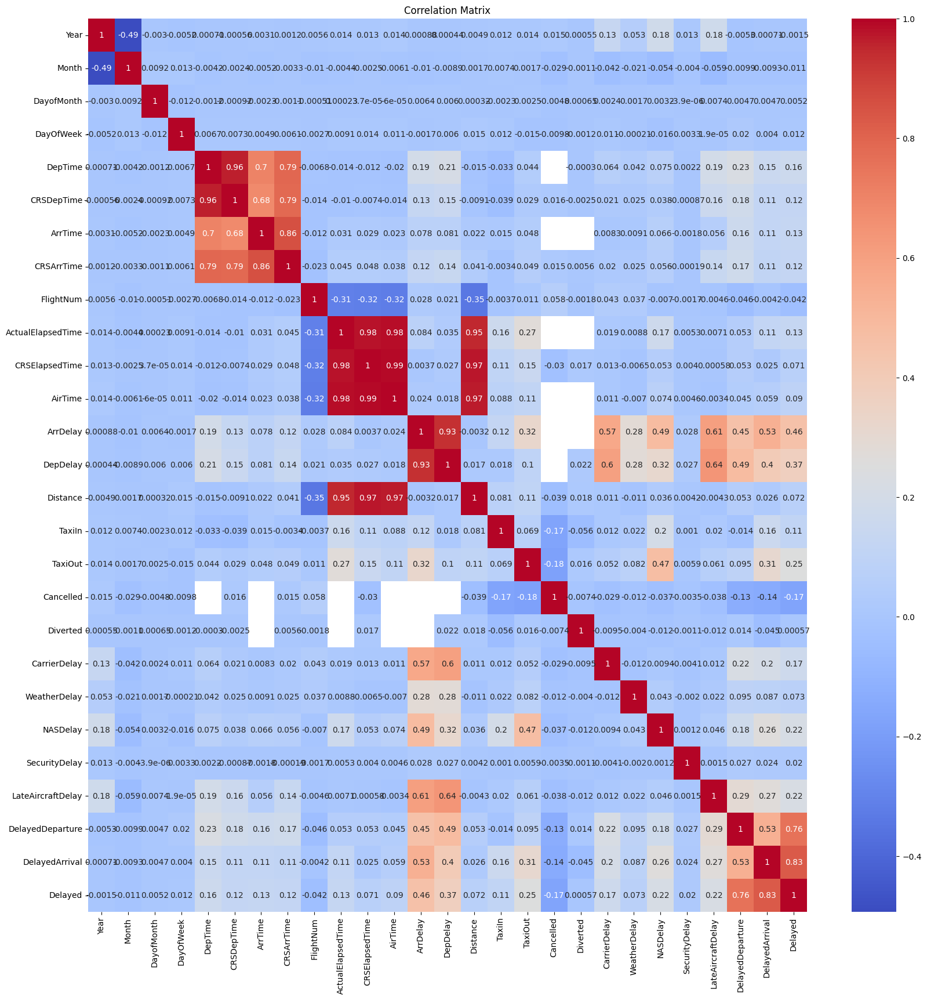

In [10]:
corrMatrix = flights[flights.columns[flights.dtypes != "object"]].corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corrMatrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.savefig("../plots/correlation_matrix.png")
plt.show()

# Exploring how different factors relate to delays

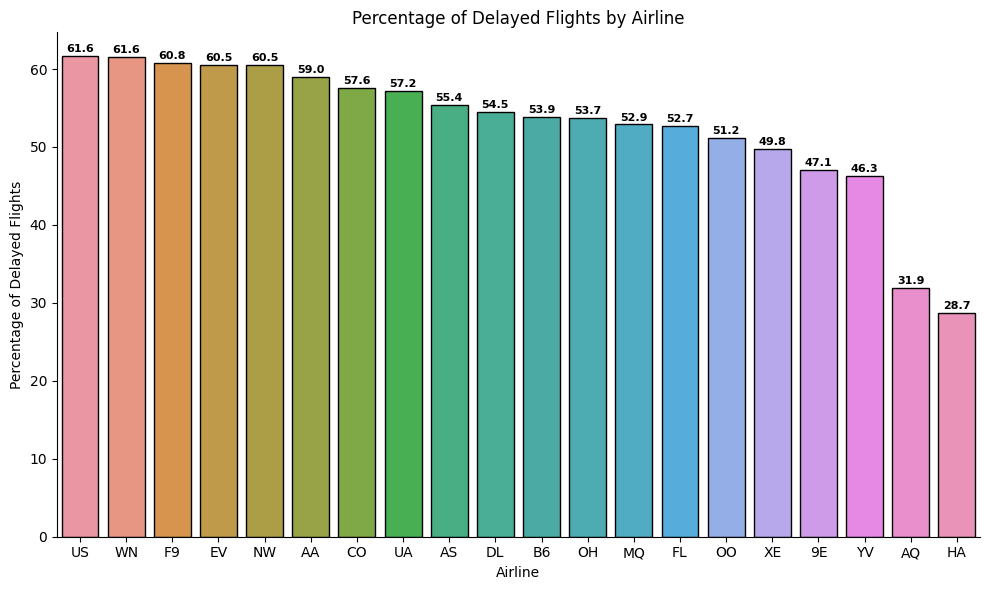

In [11]:
delay_by_carrier = flights.groupby("UniqueCarrier")["Delayed"].mean().sort_values(ascending=False) * 100

plt.figure(figsize=(10, 6))
sns.barplot(x=delay_by_carrier.index, y=delay_by_carrier.values)
plt.xlabel("Airline")
plt.ylabel("Percentage of Delayed Flights")
plt.title("Percentage of Delayed Flights by Airline")
for i, v in enumerate(delay_by_carrier):
    plt.text(i, v + 0.5, str(round(v, 1)), ha="center", fontsize=8, fontweight="bold")
    plt.gca().patches[i].set_edgecolor('black')
sns.despine()
plt.tight_layout()
plt.savefig("../plots/delay_by_carrier.png")
plt.show()

In [12]:
#Interactive plot
fig = px.bar(delay_by_carrier, x=delay_by_carrier.index, y=delay_by_carrier.values, title="Percentage of delayed flights by airline")
fig.update_layout(xaxis_tickangle=-45)
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="LightSteelBlue",
)
fig.update_xaxes(title_text="Airline")
fig.update_yaxes(title_text="Percentage of delayed flights")
fig.write_html("../plots/delay_by_carrier_interactive.html")
fig.show()

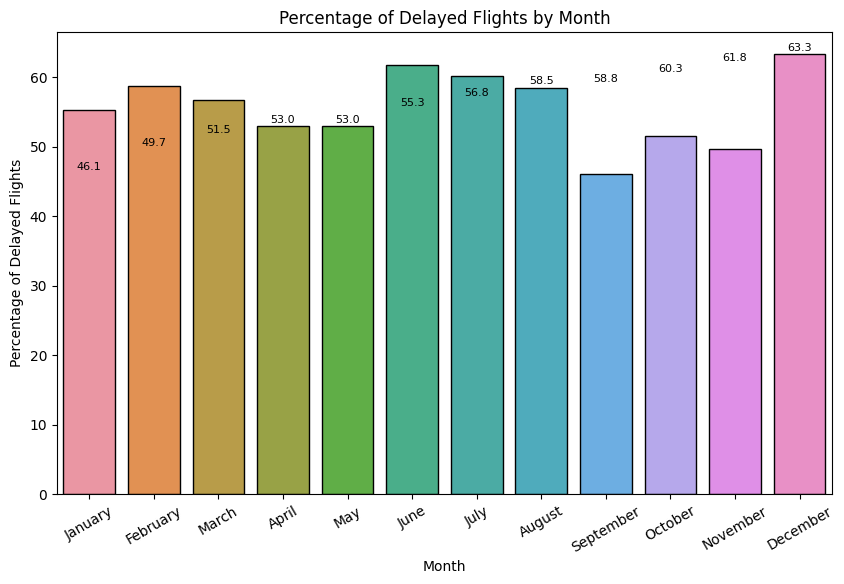

In [13]:
delay_by_month = flights.groupby("Month")["Delayed"].mean().sort_values() * 100
months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]

plt.figure(figsize=(10, 6))
sns.barplot(x=delay_by_month.index, y=delay_by_month.values)
plt.xlabel("Month")
plt.ylabel("Percentage of Delayed Flights")
plt.title("Percentage of Delayed Flights by Month")
plt.xticks(range(12), months)
plt.xticks(rotation=30)
for i, v in enumerate(delay_by_month):
    plt.text(i, v + 0.5, str(round(v, 1)), ha="center", fontsize=8)
    plt.gca().patches[i].set_edgecolor('black')
plt.savefig("../plots/delay_by_month.png")
plt.show()


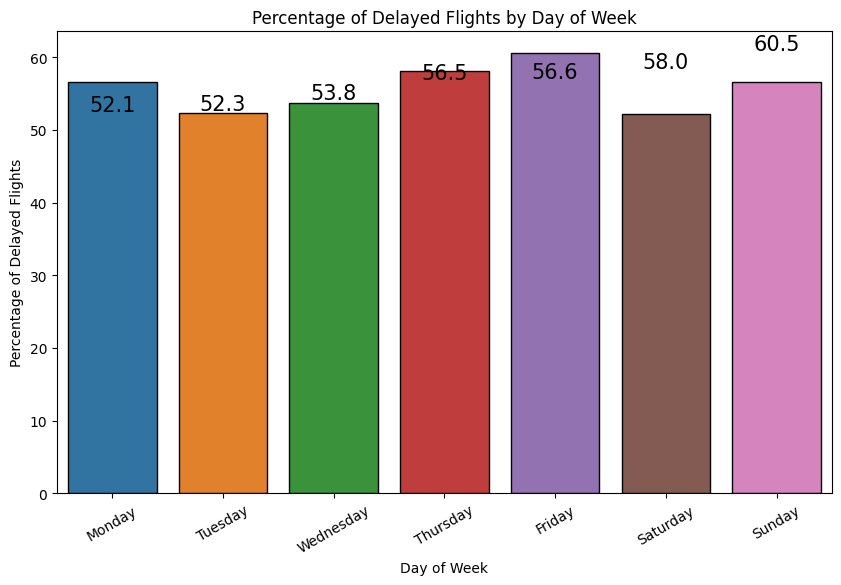

In [14]:
delay_by_day = flights.groupby("DayOfWeek")["Delayed"].mean().sort_values() * 100
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

plt.figure(figsize=(10,6))
sns.barplot(x=delay_by_day.index, y=delay_by_day.values)
plt.xlabel("Day of Week")
plt.ylabel("Percentage of Delayed Flights")
plt.title("Percentage of Delayed Flights by Day of Week")
plt.xticks(range(7), days)
plt.xticks(rotation=30)
for i, v in enumerate(delay_by_day):
    plt.text(i, v + 0.5, str(round(v, 1)), ha="center", fontsize=15)
    plt.gca().patches[i].set_edgecolor("black")
sns.set_palette("pastel")
plt.savefig("../plots/delay_by_day.png")
plt.show()

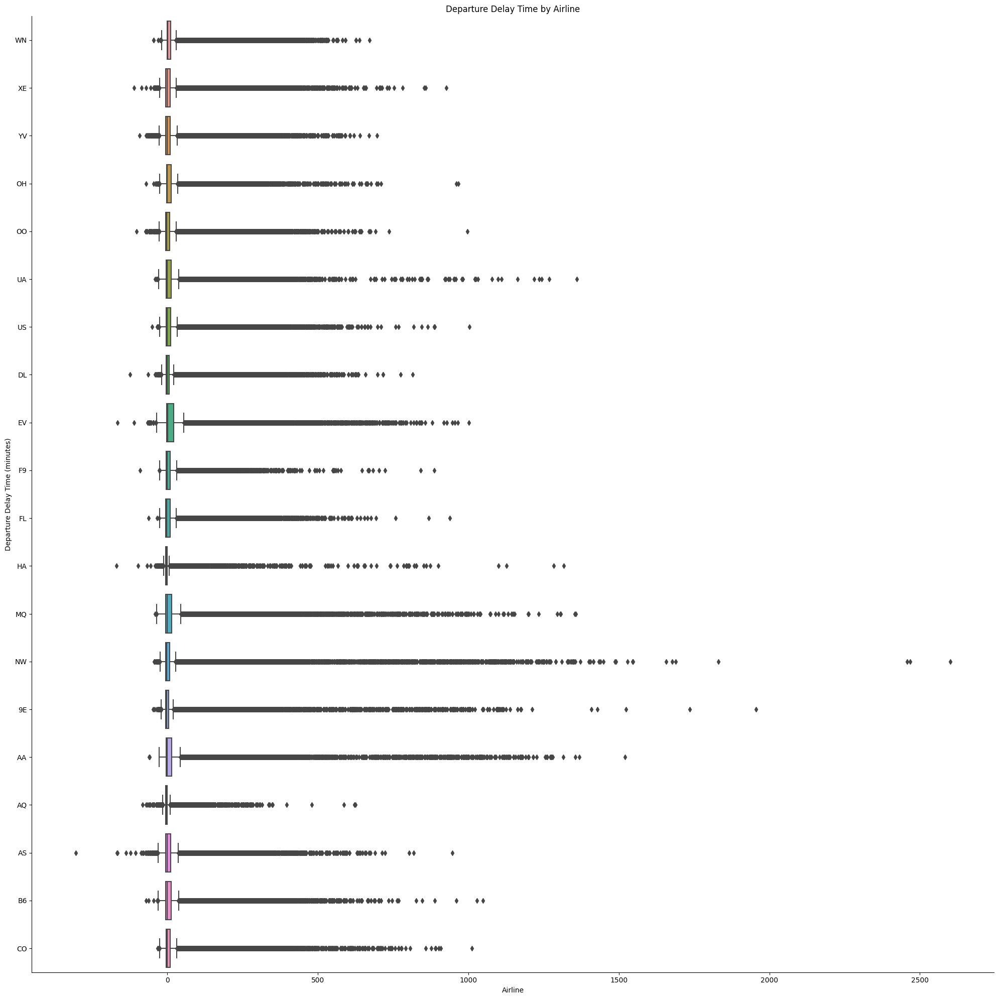

In [15]:
plt.figure(figsize=(20, 20))
sns.boxplot(y="UniqueCarrier", x="DepDelay", data=flights)
plt.xlabel("Airline")
plt.ylabel("Departure Delay Time (minutes)")
plt.title("Departure Delay Time by Airline")
sns.set_palette("pastel")
sns.despine()
plt.tight_layout()
plt.savefig("../plots/delay_by_carrier_distribution.png")
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_18744\2408758543.py:7: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

c:\Users\Admin\anaconda3\envs\test\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



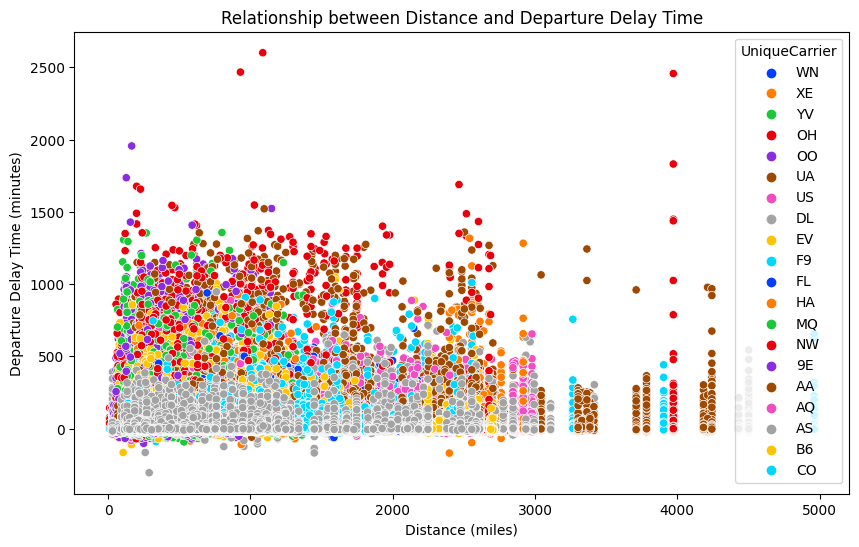

In [16]:
# Create a scatter plot to show the relationship between the distance and the departure delay time of the flights
plt.figure(figsize=(10,6))
sns.scatterplot(x="Distance", y="DepDelay", data=flights, hue="UniqueCarrier", palette="bright")
plt.xlabel("Distance (miles)")
plt.ylabel("Departure Delay Time (minutes)")
plt.title("Relationship between Distance and Departure Delay Time")
plt.savefig("../plots/distance_vs_departure_delay.png")
plt.show()

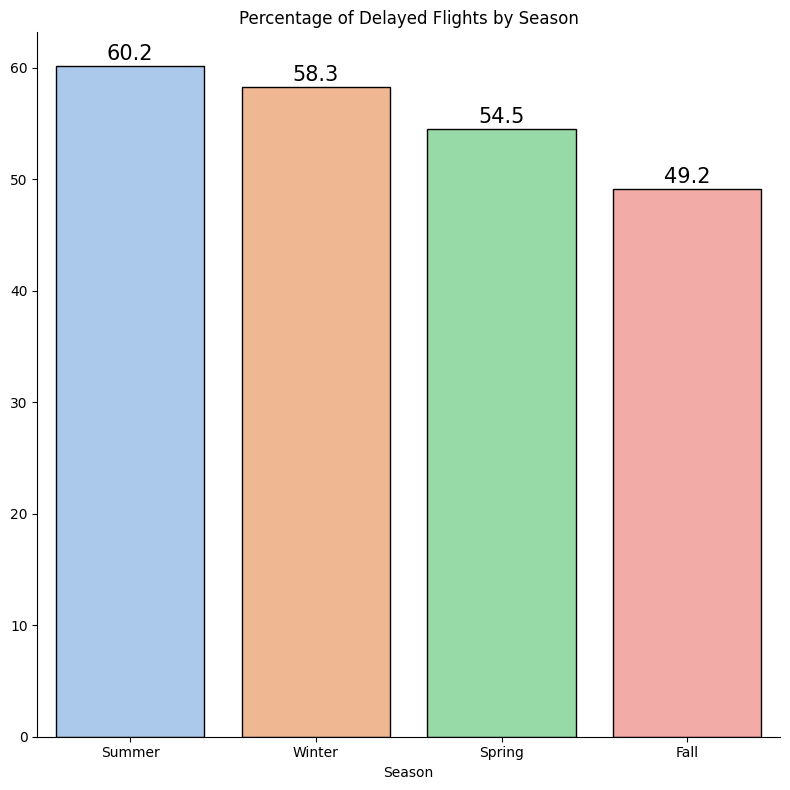

In [16]:
seasons = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}

flights['Season'] = flights['Month'].map(seasons)

delayed = flights[flights['Delayed'] > 0] 
delay_by_season = delayed.groupby('Season')['FlightNum'].count() # Count the number of delayed flights by season
total_by_season = flights.groupby('Season')['FlightNum'].count() # Count the total number of flights by season
delay_by_seson_percent = delay_by_season / total_by_season * 100  # Calculate the percentage of delayed flights by season
delay_by_seson_percent = delay_by_seson_percent.sort_values(ascending=False)

plt.figure(figsize=(8,8))
sns.barplot(x=delay_by_seson_percent.index, y=delay_by_seson_percent.values)
sns.set_palette("pastel")
plt.title('Percentage of Delayed Flights by Season')
for i, v in enumerate(delay_by_seson_percent):
    plt.text(i, v + 0.5, str(round(v, 1)), ha="center", fontsize=15)
    plt.gca().patches[i].set_edgecolor('black')
sns.despine()
plt.tight_layout()
sns.set_palette("pastel")
plt.savefig("../plots/delay_by_season.png")
plt.show()


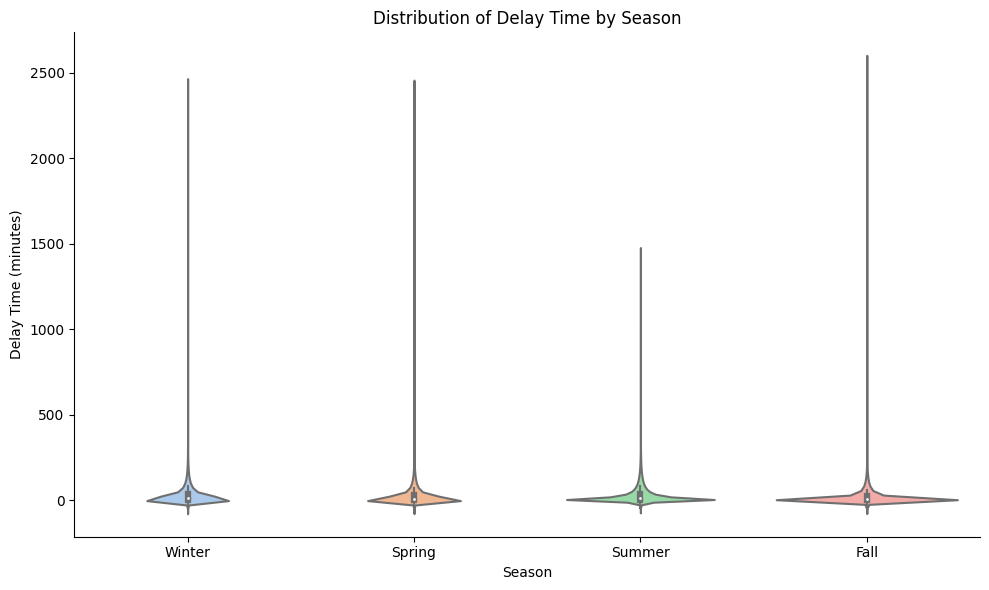

In [17]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Season', y='ArrDelay', data=delayed)
sns.set_palette("pastel")
plt.title('Distribution of Delay Time by Season')
plt.xlabel('Season') 
plt.ylabel('Delay Time (minutes)') 
sns.despine()
plt.tight_layout()
sns.set_palette("pastel") 
plt.savefig("../plots/delay_by_season_distribution.png")
plt.show()


# Comparing routes

#### What is the average delay for each route?

In [18]:
grouped_by_routes = flights.groupby(["Origin", "Dest"])

# Calculate the average departure and arrival delays for each route
avg_delays = grouped_by_routes[["DepDelay", "ArrDelay"]].mean().reset_index()

avg_delays.head()


,Origin,Dest,DepDelay,ArrDelay
0,ABE,ATL,20.419614,16.756866
1,ABE,BHM,11.000000,-3.000000
2,ABE,BWI,80.000000,61.000000
3,ABE,CLE,-2.970782,0.122807
4,ABE,CLT,-3.547170,-4.044025


In [19]:
# Find the top 10 routes with...
def get_top_routes(col, n, least=True):
    return avg_delays.sort_values(col, ascending=least)[["Origin", "Dest", col]].head(n).set_index(i for i in range(1, n + 1)).rename_axis("Rank", axis=1)


In [20]:
# The highest average departure delays
get_top_routes("DepDelay", 10, least=False)

Rank,Origin,Dest,DepDelay
1,ONT,IAD,386.0
2,ABQ,GJT,366.0
3,SDF,SPI,329.0
4,ELP,MFE,307.0
5,HPN,PIA,298.0
6,OKC,GJT,270.0
7,ACY,MYR,222.0
8,AUS,RFD,211.0
9,ACV,SJC,211.0
10,ORD,ONT,209.0


In [21]:
# The highest average arrival delays
get_top_routes("ArrDelay", 10, least=False)


Rank,Origin,Dest,ArrDelay
1,ONT,IAD,370.0
2,ELP,MFE,316.0
3,ACY,MYR,252.0
4,JAX,CMH,217.0
5,DCA,PLN,210.0
6,ATW,DSM,210.0
7,AVP,BUF,195.0
8,JFK,GSO,181.0
9,ORF,BOI,180.0
10,GSP,RSW,175.0


In [22]:
# Tthe lowest average departure delays
get_top_routes("DepDelay", 10)


Rank,Origin,Dest,DepDelay
1,SDF,JAX,-85.0
2,OMA,LNK,-34.0
3,FSD,SDF,-25.0
4,ATW,CHS,-23.0
5,BNA,FSD,-23.0
6,HPN,PIT,-22.0
7,RDM,SMF,-22.0
8,BDL,BOS,-20.0
9,BOS,BTV,-18.0
10,LAX,SDF,-16.0


In [23]:
# Find the top 10 routes with the highest sum of average departure and arrival delays
avg_delays["TotalDelay"] = avg_delays["DepDelay"] + avg_delays["ArrDelay"]
get_top_routes("TotalDelay", 10, least=False)


Rank,Origin,Dest,TotalDelay
1,ONT,IAD,756.0
2,ELP,MFE,623.0
3,ACY,MYR,474.0
4,AVP,BUF,396.0
5,ATW,DSM,395.0
6,JAX,CMH,382.0
7,DCA,PLN,378.0
8,JFK,GSO,354.0
9,ORF,BOI,340.0
10,FAT,BOI,306.0


### Routes with the highest and lowest average departure delays

In [24]:
coords = airports[["iata", "lat", "lon"]]
coords.columns = ["Origin", "Latitude", "Longitude"]

merged = pd.merge(avg_delays, coords, on="Origin")
merged.head()

,Origin,Dest,DepDelay,ArrDelay,TotalDelay,Latitude,Longitude
0,ABE,ATL,20.419614,16.756866,37.176480,40.6521,-75.440804
1,ABE,BHM,11.000000,-3.000000,8.000000,40.6521,-75.440804
2,ABE,BWI,80.000000,61.000000,141.000000,40.6521,-75.440804
3,ABE,CLE,-2.970782,0.122807,-2.847975,40.6521,-75.440804
4,ABE,CLT,-3.547170,-4.044025,-7.591195,40.6521,-75.440804


In [27]:
m = folium.Map()

# Make the map dark
folium.TileLayer('cartodbdark_matter',name="Routes and their average delays", control=False).add_to(m)

# Create a color scale object using branca
color_scale = branca.colormap.linear.RdYlGn_11.scale(0, 200)

# sort the tresholds
color_scale = color_scale.to_step(index=[10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

# Loop through the merged dataframe and add lines to the map
for i, row in merged.iterrows():
    # Get the origin and destination coordinates
    origin = [row["Latitude"], row["Longitude"]]
    dest = coords[coords["Origin"] == row["Dest"]][["Latitude", "Longitude"]].values[0]
    # Get the departure delay
    delay = row["DepDelay"]
    folium.CircleMarker(origin, radius=3, color="blue").add_to(m)
    folium.Marker(origin, popup=row["Origin"]).add_to(m)
    # Add a line to the map with the corresponding color and popup
    folium.PolyLine([origin, dest], color=color_scale(-delay + 50), popup=f"{row['Origin']} - {row['Dest']}: {delay:.2f} min").add_to(m)

# Add the color scale to the map
color_scale.caption = "Average departure delay (min)"
m.add_child(color_scale)

# Add a layer control to the map
folium.LayerControl().add_to(m)

# Change the zoom
m.fit_bounds(m.get_bounds())

m.save("../plots/routes_average_delay_map.html")
m


The plot below shows the routes with the highest and lowest average departure delays. The routes are colored according to the average departure delay of the flights in that route. Green means the flights departed earlier than scheduled, delayed flights are in shades of red, according to the delay. You can also click on any route to see the origin and destination airports and the exact average departure delay in minutes.

In [28]:
outliers = merged[(merged["DepDelay"] > merged["DepDelay"].quantile(0.995)) | (merged["DepDelay"] < merged["DepDelay"].quantile(0.005))]

m = folium.Map()

# Create a color scale object using branca
color_scale = branca.colormap.linear.RdYlGn_11.scale(0, outliers["DepDelay"].max())

def color(delay):
    if delay <= 0:
        return "green"
    return color_scale(-delay + 50)

# Make the map dark
folium.TileLayer('cartodbdark_matter',name="Routes with the highest and lowest average departure delays", control=False).add_to(m)

# Loop through the merged dataframe and add lines to the map
for i, row in outliers.iterrows():
    # Get the origin and destination coordinates
    origin = [row["Latitude"], row["Longitude"]]
    dest = coords[coords["Origin"] == row["Dest"]][["Latitude", "Longitude"]].values[0]
    # Get the departure delay
    delay = row["DepDelay"]
    folium.CircleMarker(origin, radius=3, color="blue").add_to(m)
    folium.Marker(origin, popup=row["Origin"]).add_to(m)
    # Add a line to the map with the corresponding color and popup
    folium.PolyLine([origin, dest], color=color(delay), popup=f"{row['Origin']} - {row['Dest']}: {delay:.2f} min").add_to(m)

# Add the color scale to the map
color_scale.caption = "Average departure delay (min)"
m.add_child(color_scale)

# Add a layer control to the map
folium.LayerControl().add_to(m)

# Change the zoom
m.fit_bounds(m.get_bounds())

m.save("../plots/routes_outlying_average_routes_map.html")
m

### Routes with the most and least often delayed departures

In [29]:
delay_count = pd.DataFrame(flights[flights["Delayed"] == True].value_counts(["Origin", "Dest"])).reset_index()
merged = pd.merge(delay_count, merged, on=["Origin", "Dest"])
merged

,Origin,Dest,count,DepDelay,ArrDelay,TotalDelay,Latitude,Longitude
0,LAX,LAS,10604,8.231945,8.263103,16.495047,33.942501,-118.407997
1,LAS,LAX,10549,9.746355,8.797824,18.544179,36.080101,-115.152000
2,PHX,LAS,9833,10.174171,8.603924,18.778095,33.434299,-112.012001
3,ORD,LGA,9440,23.849619,25.547798,49.397417,41.978600,-87.904800
4,ATL,LGA,9439,17.227599,18.287838,35.515436,33.636700,-84.428101
...,...,...,...,...,...,...,...,...
5405,CHS,JAX,1,-7.500000,-4.500000,-12.000000,32.898602,-80.040497
5406,CHS,IND,1,23.000000,NaN,NaN,32.898602,-80.040497
5407,ORF,BOI,1,160.000000,180.000000,340.000000,36.894600,-76.201202
5408,DCA,PLN,1,168.000000,210.000000,378.000000,38.852100,-77.037697


The plot below shows the routes with the highest count of delayed flights. You can also click on any route to see exact number of delayed flights.

In [31]:
outliers = merged[merged["count"] > merged["count"].quantile(0.99)]

m = folium.Map()

# Create a color scale object using branca
color_scale = branca.colormap.linear.viridis.scale(outliers["count"].min(), outliers["count"].max())
#set other branca colormap


#make the map dark
folium.TileLayer('cartodbdark_matter', name="Dark Map", control=False).add_to(m)


for i, row in outliers.iterrows():
    # Get the origin and destination coordinates
    origin = [row["Latitude"], row["Longitude"]]
    dest = coords[coords["Origin"] == row["Dest"]][["Latitude", "Longitude"]].values[0]
    # Get the number of departure delays
    count = row["count"]
    folium.CircleMarker(origin, radius=3, color="blue").add_to(m)
    folium.Marker(origin, popup=row["Origin"]).add_to(m)
    # Add a line to the map with the corresponding color and popup
    folium.PolyLine([origin, dest], color=color_scale(count), popup=f"{row['Origin']} - {row['Dest']}: {count:.2f} times").add_to(m)

color_scale.caption = "Average departure delay (min)"
m.add_child(color_scale)
folium.LayerControl().add_to(m)
m.fit_bounds(m.get_bounds())

m.save("../plots/routes_most_often_delayed_map.html")
m